In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
from sklearn import linear_model
import seaborn as sns
import yfinance as yf
%matplotlib widget
sns.set_style("darkgrid")
sns.set(font_scale=1.7)


In [2]:
def pair(buy_ticker, sell_ticker, long_financials, short_financials):

    ticker1 = yf.Ticker(buy_ticker)
    ticker2 = yf.Ticker(sell_ticker)
    beta_ticker = yf.Ticker("SPY")

    dataFrame1 = ticker1.history(
        start='2010-1-1', actions=True, rounding=True)
    dataFrame2 = ticker2.history(
        start='2010-1-1', actions=True, rounding=True)
    spy = beta_ticker.history(
        start='2010-1-1', actions=True, rounding=True)

    ratio = dataFrame1.Close / dataFrame2.Close
    spread = dataFrame1.Close - dataFrame2.Close

    chart = fig, axes = plt.subplots(3, figsize=(18, 12))
    axes[0].set_title(f"{buy_ticker} / {sell_ticker}")
    sns.lineplot(data=dataFrame1, x="Date", y="Close",
                 ax=axes[0], label=buy_ticker)
    sns.lineplot(data=dataFrame2, x="Date", y="Close",
                 ax=axes[0], label=sell_ticker)
    axes[1].set_title(f"{buy_ticker} / {sell_ticker}")
    sns.lineplot(data=ratio, ax=axes[1])
    axes[2].set_title(f"{buy_ticker} / {sell_ticker}")
    sns.lineplot(data=spread, ax=axes[2])
    plt.tight_layout(pad=1)

    spy_ticker1 = pd.concat(
        [spy.Close[-500::], dataFrame1.Close[-500::]], axis=1)
    spy_ticker1.columns = ["SPY", buy_ticker]
    long_data_pct = np.log(spy_ticker1/spy_ticker1.shift())
    ticker1_cov = long_data_pct.cov().iloc[0, 1]
    ticker1_var = long_data_pct["SPY"].var()
    long_beta = ticker1_cov/ticker1_var
    print("Long BETA:", np.round(long_beta, 2))

    spy_ticker2 = pd.concat(
        [spy.Close[-500::], dataFrame2.Close[-500::]], axis=1)
    spy_ticker2.columns = ["SPY", sell_ticker]
    short_data_pct = np.log(spy_ticker2/spy_ticker2.shift())
    ticker2_cov = short_data_pct.cov().iloc[0, 1]
    ticker2_var = short_data_pct["SPY"].var()
    short_beta = ticker2_cov/ticker2_var
    print("Short BETA:", np.round(short_beta, 2))

    # financials:
    print(long_financials)
    print(short_financials)

    return chart


Long BETA: 1.38
Short BETA: 0.89
Long position MAC P/E ratio = 39.791668, dividend: 0.0636, Gross profit: 487080000
short position RES P/E ratio = 23.948719, dividend: 0.009, Gross Profit: 201667000


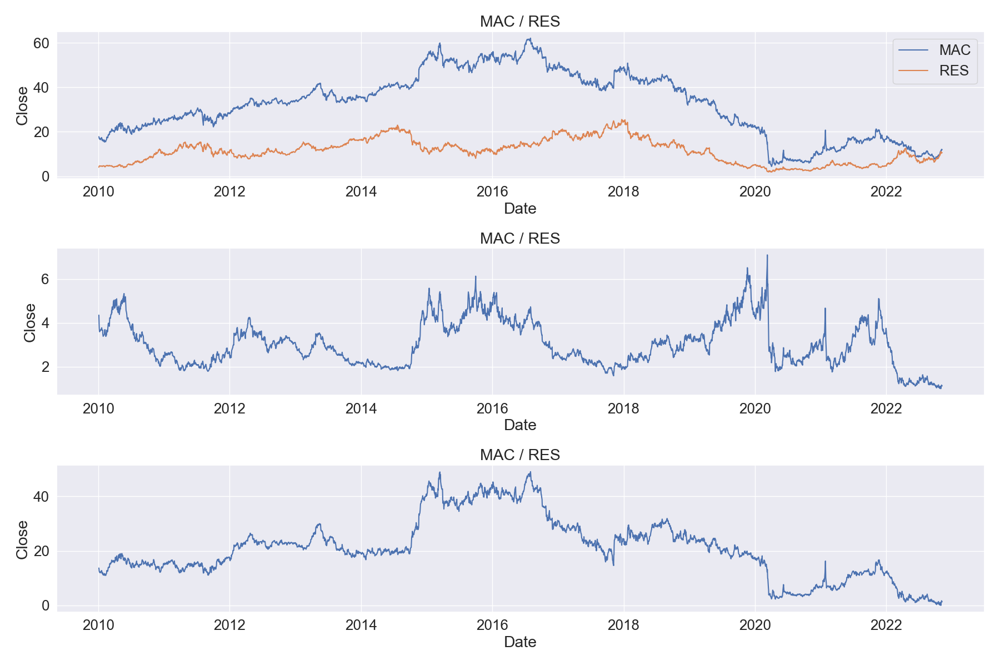

In [3]:
pair("MAC", "RES", "Long position MAC P/E ratio = 39.791668, dividend: 0.0636, Gross profit: 487080000",
     "short position RES P/E ratio = 23.948719, dividend: 0.009, Gross Profit: 201667000");

Long BETA: 0.82
Short BETA: 1.19
Long position PDM P/E ratio = 26.157894, dividend: 0.0845, Gross profit: 317778000
short position SHO P/E ratio = 15.823529, dividend: 0.0186, Gross Profit: 186085000


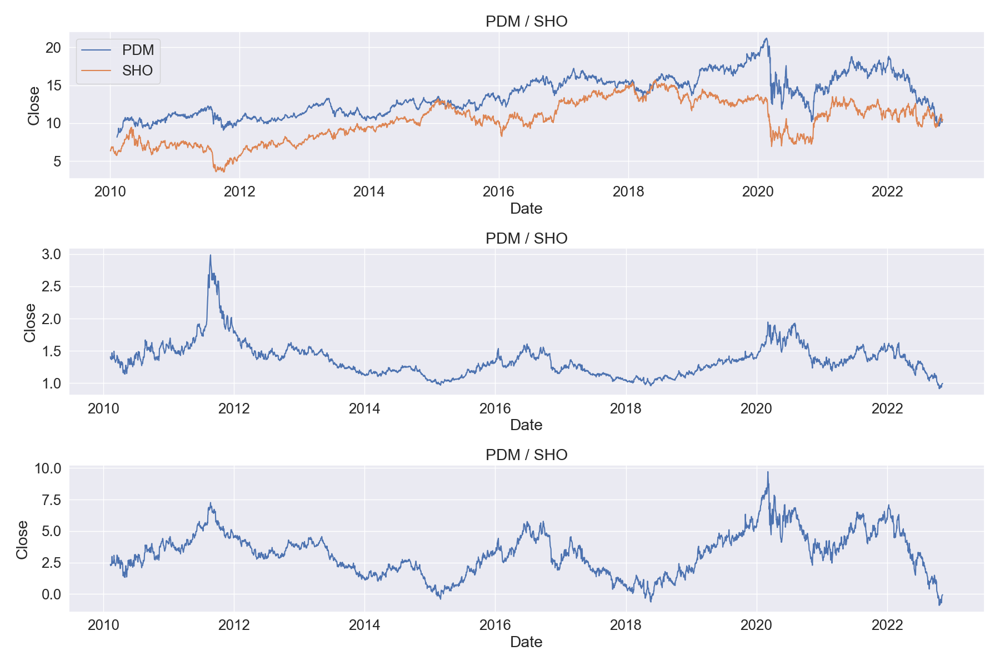

In [4]:
pair("PDM", "SHO", "Long position PDM P/E ratio = 26.157894, dividend: 0.0845, Gross profit: 317778000",
     "short position SHO P/E ratio = 15.823529, dividend: 0.0186, Gross Profit: 186085000");

Long BETA: 1.26
Short BETA: 0.75
LONG position STAR P/E ratio = 131.57143, dividend: 0.056399997, Gross Profit: 175104000
SHORT position LXP P/E ratio = 8.2972975, dividend: 0.0521, Gross profit: 296251000


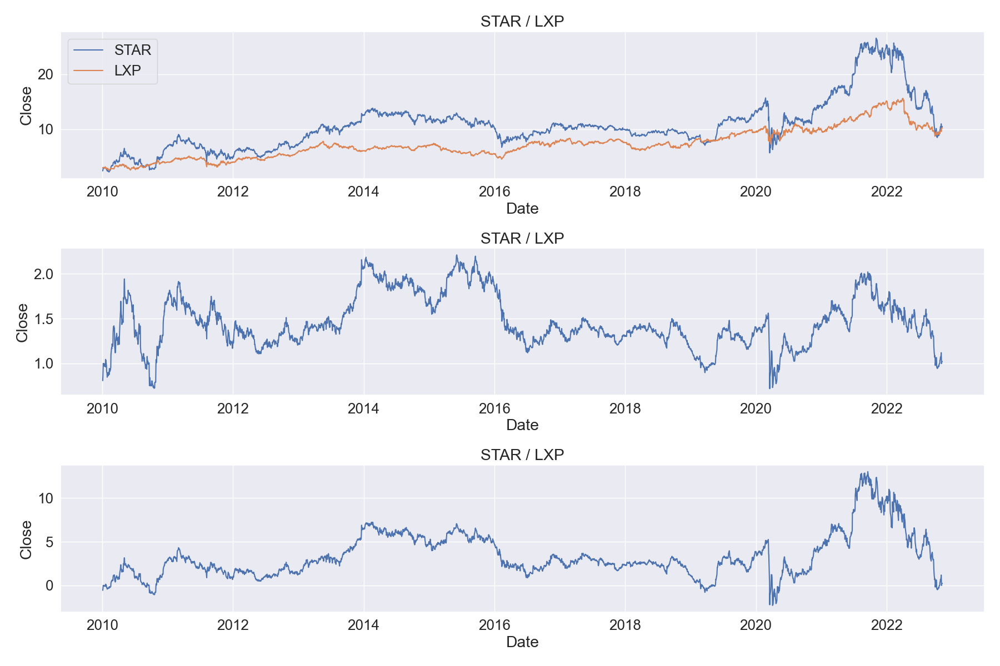

In [5]:
pair("STAR", "LXP", "LONG position STAR P/E ratio = 131.57143, dividend: 0.056399997, Gross Profit: 175104000",
     "SHORT position LXP P/E ratio = 8.2972975, dividend: 0.0521, Gross profit: 296251000");

Long BETA: 0.82
Short BETA: 0.82
LONG position VGR P/E ratio=16.199999, dividend: 0.0718, Gross Profit: 451158000
SHORT position PDM P/E ratio=5.33548, dividend: 0.061, Gross profit: 317778000


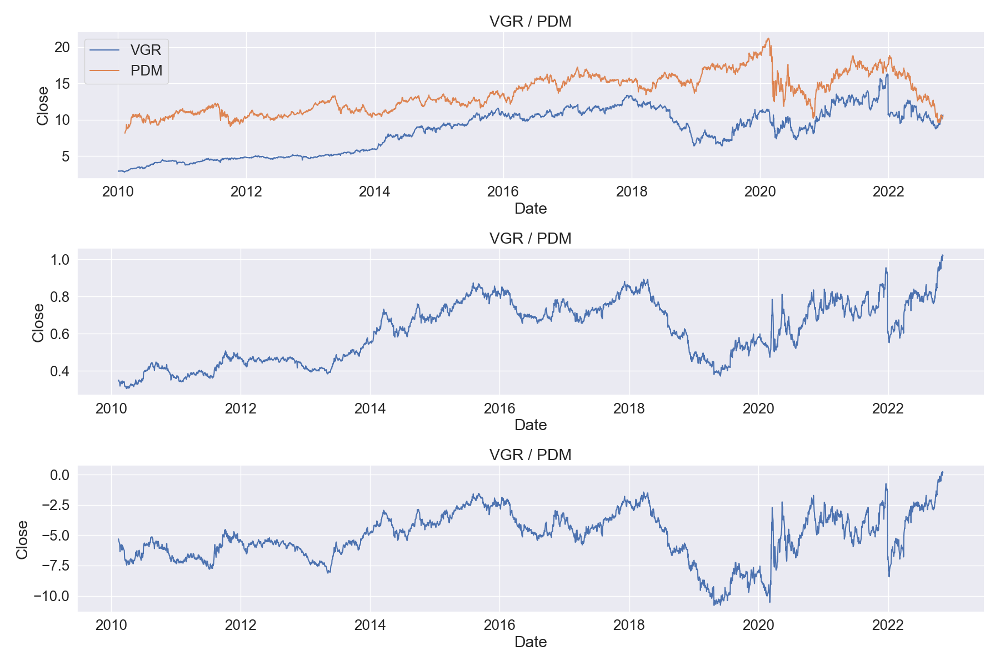

In [6]:
pair("VGR", "PDM", "LONG position VGR P/E ratio=16.199999, dividend: 0.0718, Gross Profit: 451158000",
     "SHORT position PDM P/E ratio=5.33548, dividend: 0.061, Gross profit: 317778000");

Long BETA: 0.78
Short BETA: 2.61
LONG position AGNC P/E ratio = None, dividend: 0.178, Gross Profit: 837000
SHORT position APPS P/E ratio = 37.45, dividend: None, Gross profit: 347110


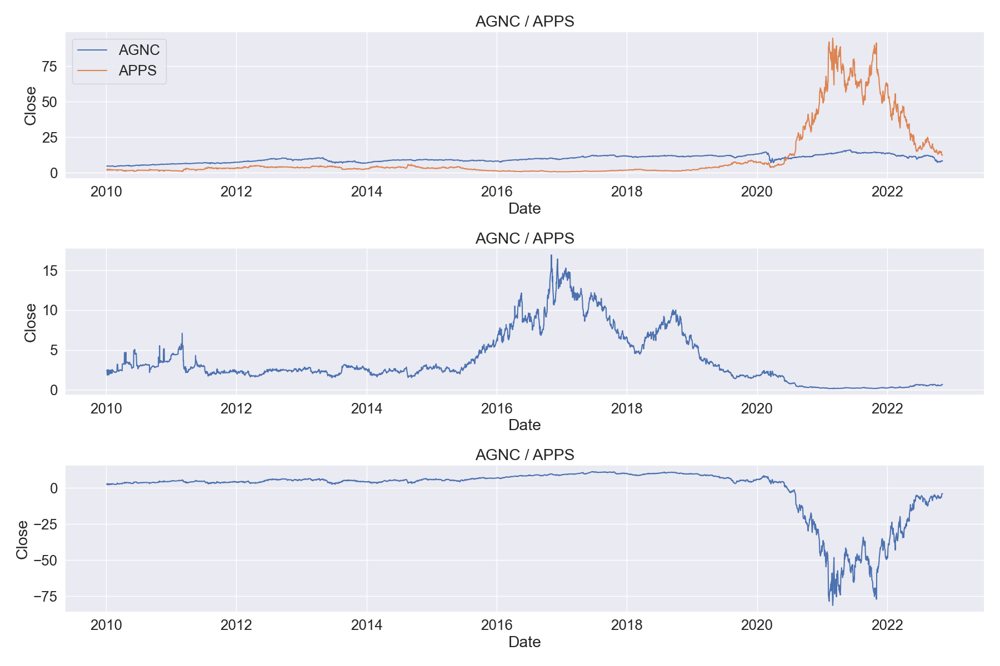

In [7]:
pair("AGNC", "APPS", "LONG position AGNC P/E ratio = None, dividend: 0.178, Gross Profit: 837000",
     "SHORT position APPS P/E ratio = 37.45, dividend: None, Gross profit: 347110");

Long BETA: 0.78
Short BETA: 1.51
LONG position AGNC P/E ratio = None, dividend: 0.178, Gross Profit: 837000
SHORT position EVRI P/E ratio = 11.15, dividend: None, Gross profit: 544936


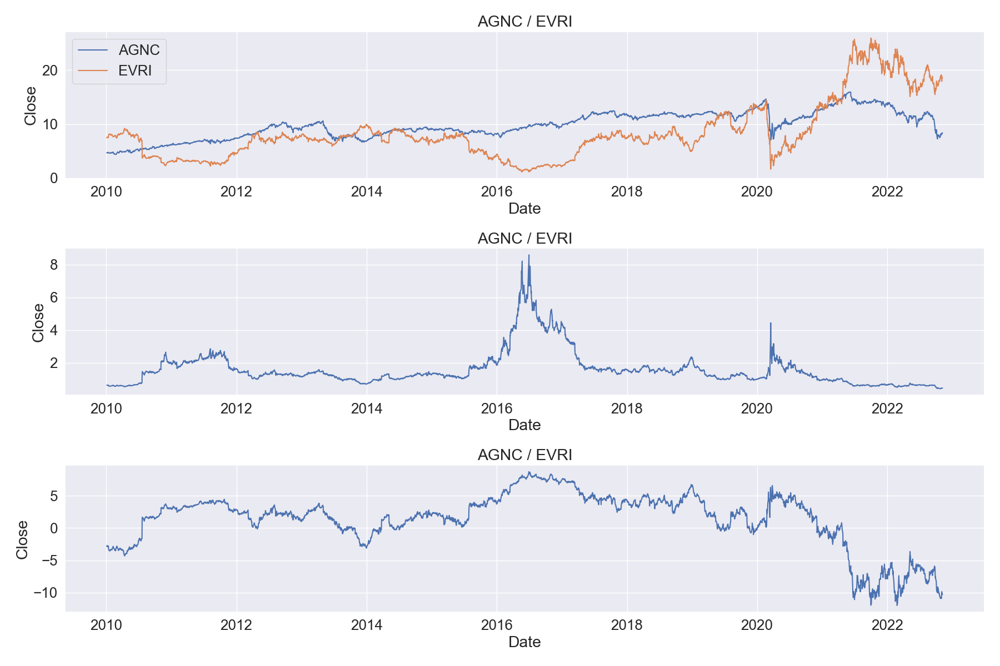

In [8]:
pair("AGNC", "EVRI", "LONG position AGNC P/E ratio = None, dividend: 0.178, Gross Profit: 837000",
     "SHORT position EVRI P/E ratio = 11.15, dividend: None, Gross profit: 544936");

Long BETA: 0.78
Short BETA: 0.47
LONG position AGNC P/E ratio = None, dividend: 0.178, Gross Profit: 837000
SHORT position T P/E ratio=6.7, dividend: 0.06, Gross profit: 89057000


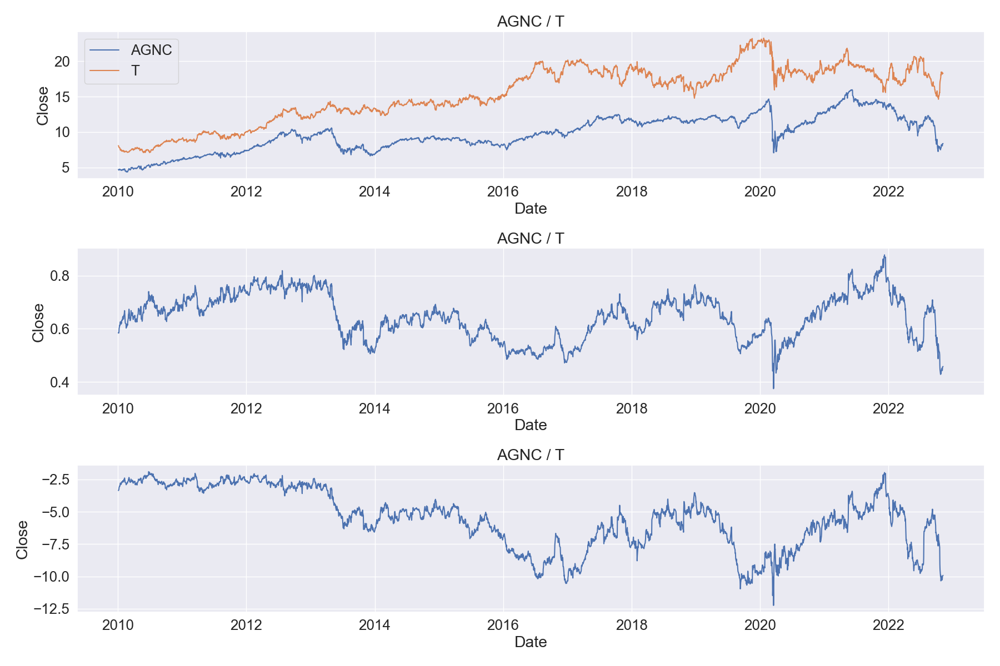

In [11]:
pair("AGNC", "T", "LONG position AGNC P/E ratio = None, dividend: 0.178, Gross Profit: 837000",
     "SHORT position T P/E ratio=6.7, dividend: 0.06, Gross profit: 89057000");

Long BETA: 0.78
Short BETA: 0.74
LONG position AGNC P/E ratio = None, dividend: 0.178, Gross Profit: 837000
SHORT position WU P/E ratio=6.04, dividend: 0.07, Gross profit: 2174400


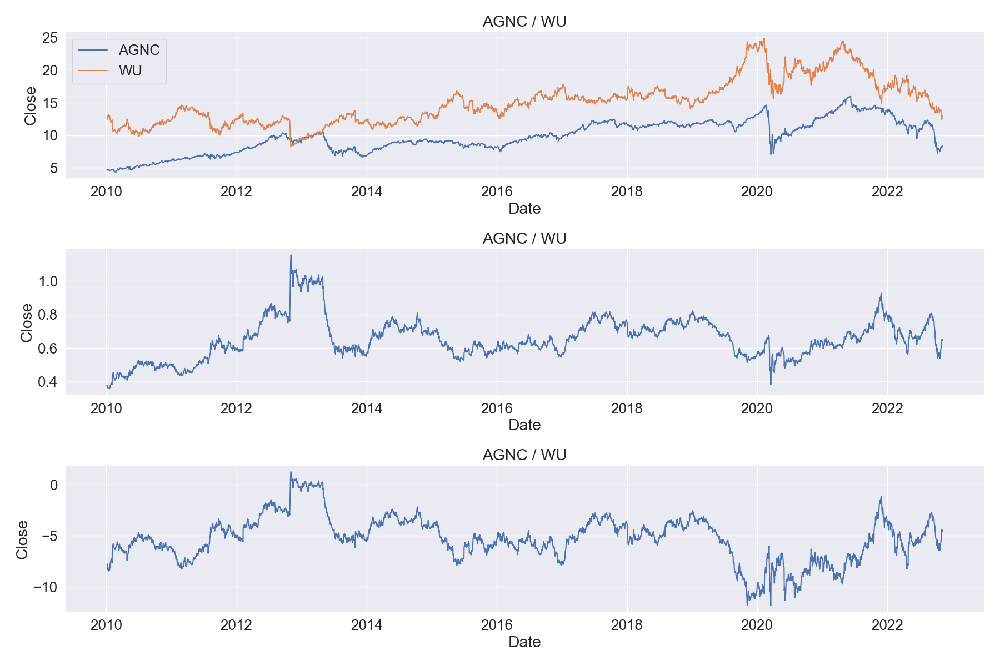

In [12]:
pair("AGNC", "WU", "LONG position AGNC P/E ratio = None, dividend: 0.178, Gross Profit: 837000",
     "SHORT position WU P/E ratio=6.04, dividend: 0.07, Gross profit: 2174400");

Long BETA: 1.02
Short BETA: 1.26
LONG position DENN P/E ratio=6.92, dividend: None, Gross Profit: 166310
SHORT position INN P/E ratio=None, dividend: 0.02, Gross profit: 158663


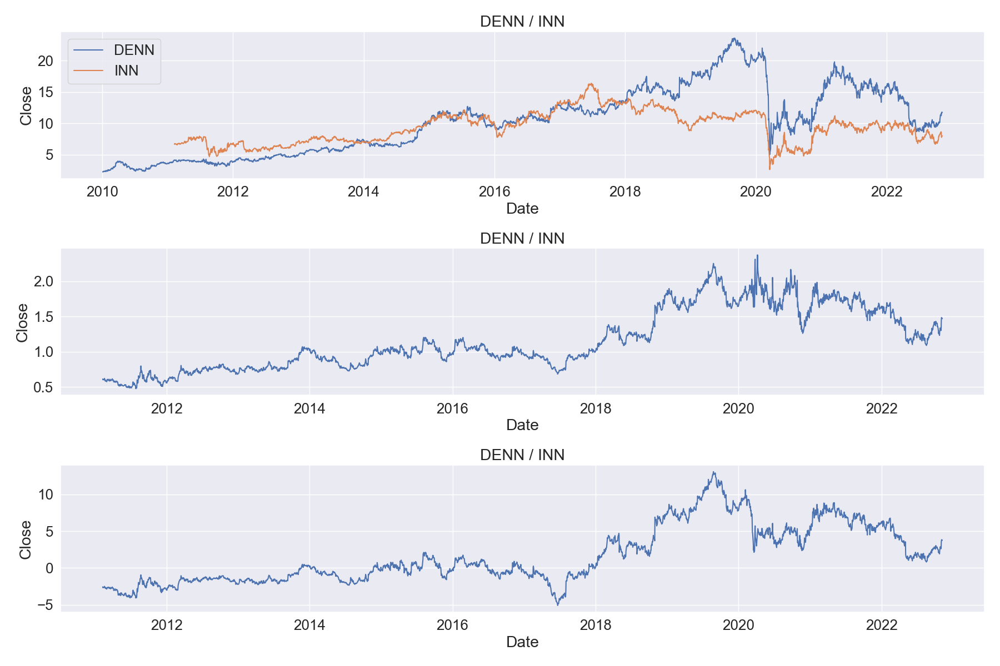

In [16]:
pair("DENN", "INN", "LONG position DENN P/E ratio=6.92, dividend: None, Gross Profit: 166310",
     "SHORT position INN P/E ratio=None, dividend: 0.02, Gross profit: 158663");

Long BETA: 1.02
Short BETA: 1.04
LONG position DENN P/E ratio=6.92, dividend: None, Gross Profit: 166310
SHORT position MTG P/E ratio=5.77, dividend: 0.03, Gross profit: 927151


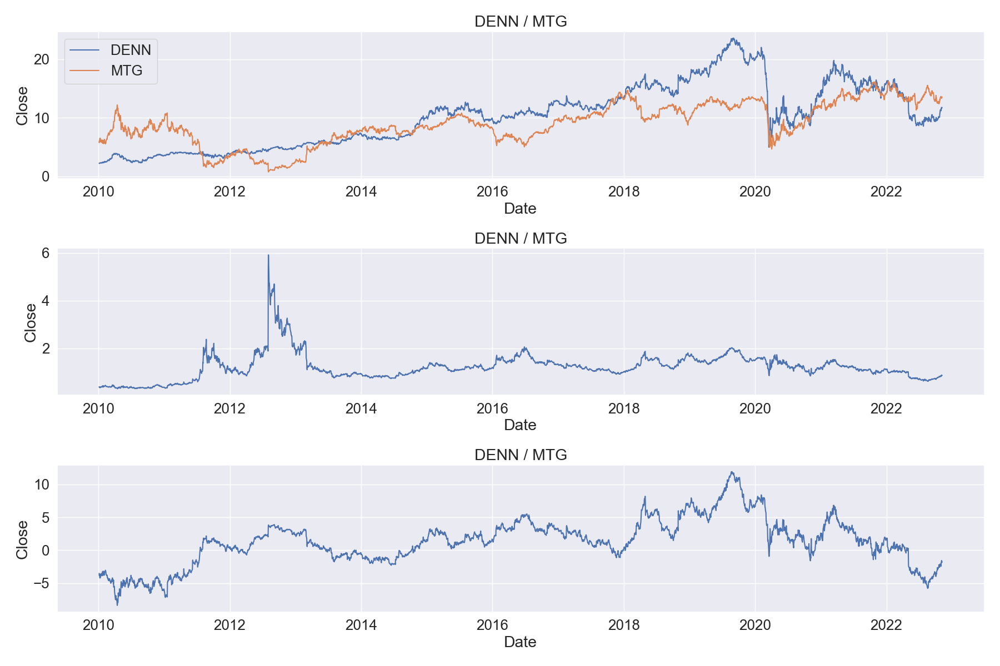

In [18]:
pair("DENN", "MTG", "LONG position DENN P/E ratio=6.92, dividend: None, Gross Profit: 166310",
     "SHORT position MTG P/E ratio=5.77, dividend: 0.03, Gross profit: 927151");

Long BETA: 1.02
Short BETA: 0.48
LONG position DENN P/E ratio=6.92, dividend: None, Gross Profit: 166310
SHORT position TGNA P/E ratio=8.29, dividend: 0.019, Gross profit: 1392334


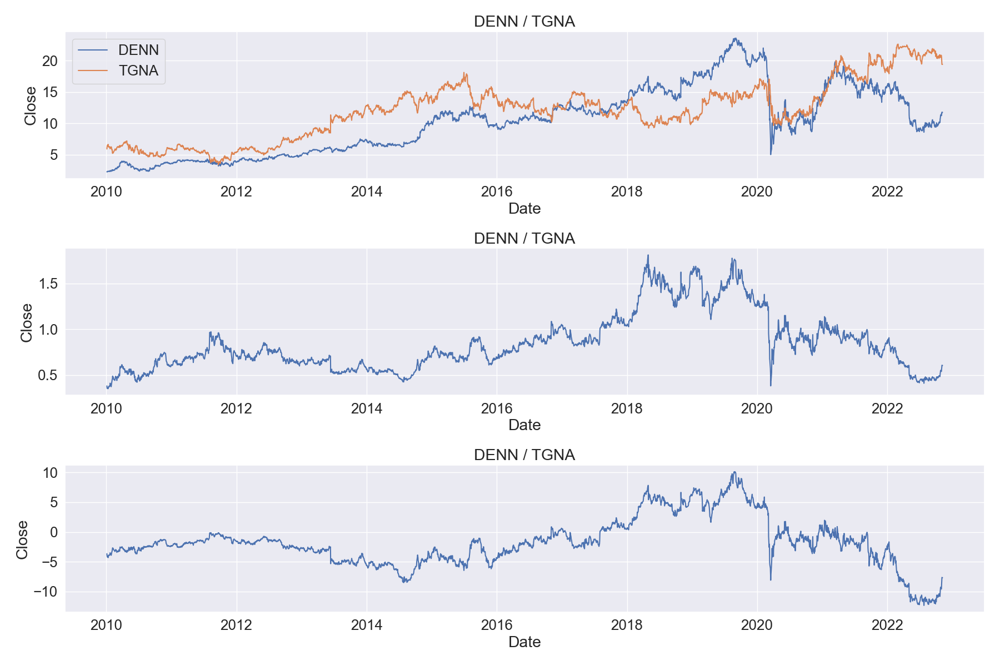

In [19]:
pair("DENN", "TGNA", "LONG position DENN P/E ratio=6.92, dividend: None, Gross Profit: 166310",
     "SHORT position TGNA P/E ratio=8.29, dividend: 0.019, Gross profit: 1392334");

Long BETA: 1.02
Short BETA: 1.33
LONG position DENN P/E ratio=6.92, dividend: None, Gross Profit: 166310
SHORT position KOS P/E ratio=15.86, dividend: None, Gross profit: 987855


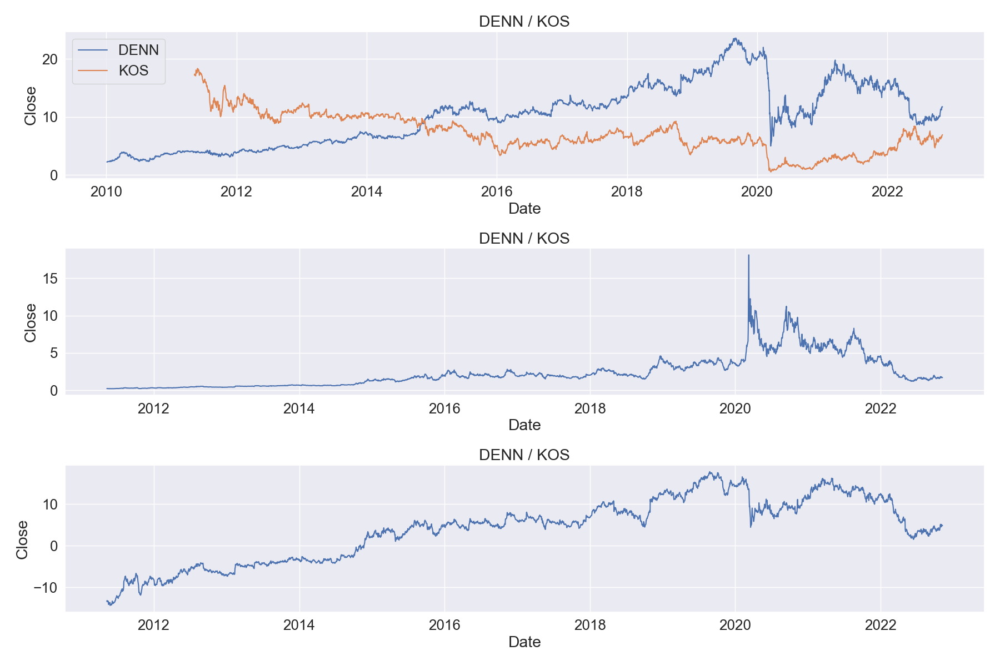

In [20]:
pair("DENN", "KOS", "LONG position DENN P/E ratio=6.92, dividend: None, Gross Profit: 166310",
     "SHORT position KOS P/E ratio=15.86, dividend: None, Gross profit: 987855");

Long BETA: 1.58
Short BETA: 1.33
LONG position DVAX P/E ratio=6.95, dividend: None, Gross Profit: 235030
SHORT position KOS P/E ratio=15.86, dividend: None, Gross profit: 987855


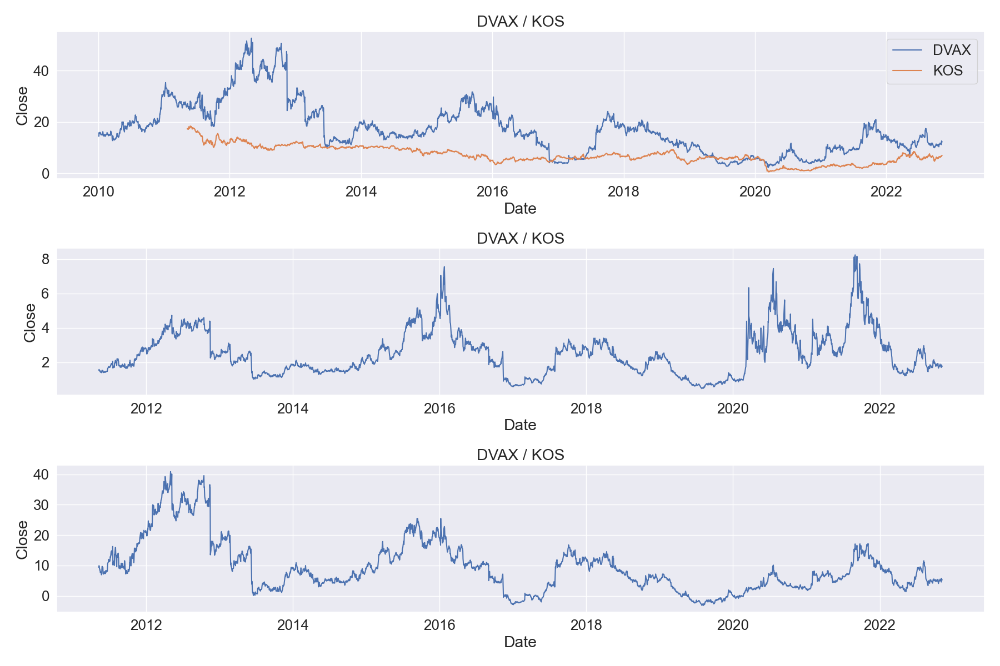

In [22]:
pair("DVAX", "KOS", "LONG position DVAX P/E ratio=6.95, dividend: None, Gross Profit: 235030",
     "SHORT position KOS P/E ratio=15.86, dividend: None, Gross profit: 987855");

Long BETA: 1.43
Short BETA: 1.01
LONG position DXLG P/E ratio=4.86, dividend: None, Gross Profit: 249424
SHORT position MAT P/E ratio=10.61, dividend: None, Gross profit: 2629547


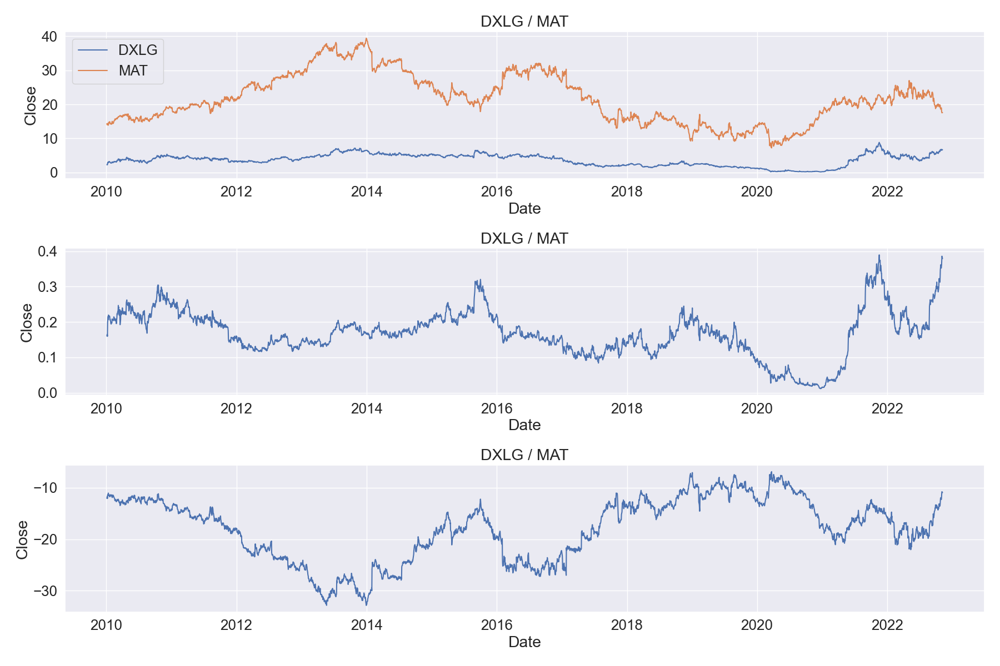

In [26]:
pair("DXLG", "MAT", "LONG position DXLG P/E ratio=4.86, dividend: None, Gross Profit: 249424",
     "SHORT position MAT P/E ratio=10.61, dividend: None, Gross profit: 2629547");

Long BETA: 1.14
Short BETA: 2.01
LONG position ENLC P/E ratio=22.3, dividend: 0.038, Gross Profit: 1655100
SHORT position DDD P/E ratio=4.58, dividend: None, Gross profit: 263778


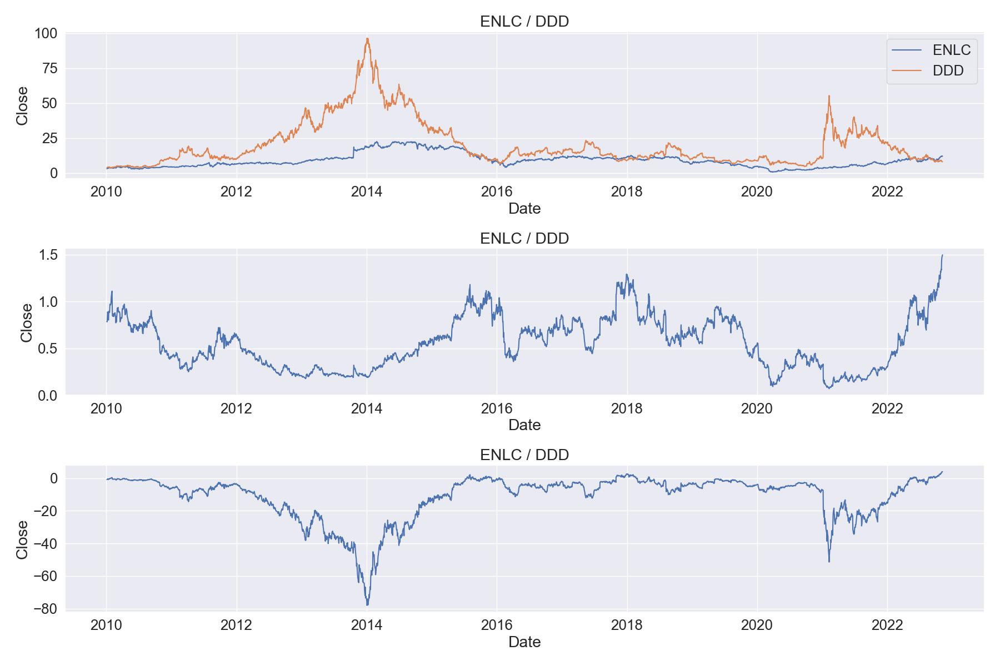

In [28]:
pair("ENLC", "DDD", "LONG position ENLC P/E ratio=22.3, dividend: 0.038, Gross Profit: 1655100",
     "SHORT position DDD P/E ratio=4.58, dividend: None, Gross profit: 263778");

Long BETA: 1.14
Short BETA: 1.41
LONG position ENLC P/E ratio=22.3, dividend: 0.038, Gross Profit: 1655100
SHORT position DISH P/E ratio = 4.55, dividend: None, Gross profit: 6142823


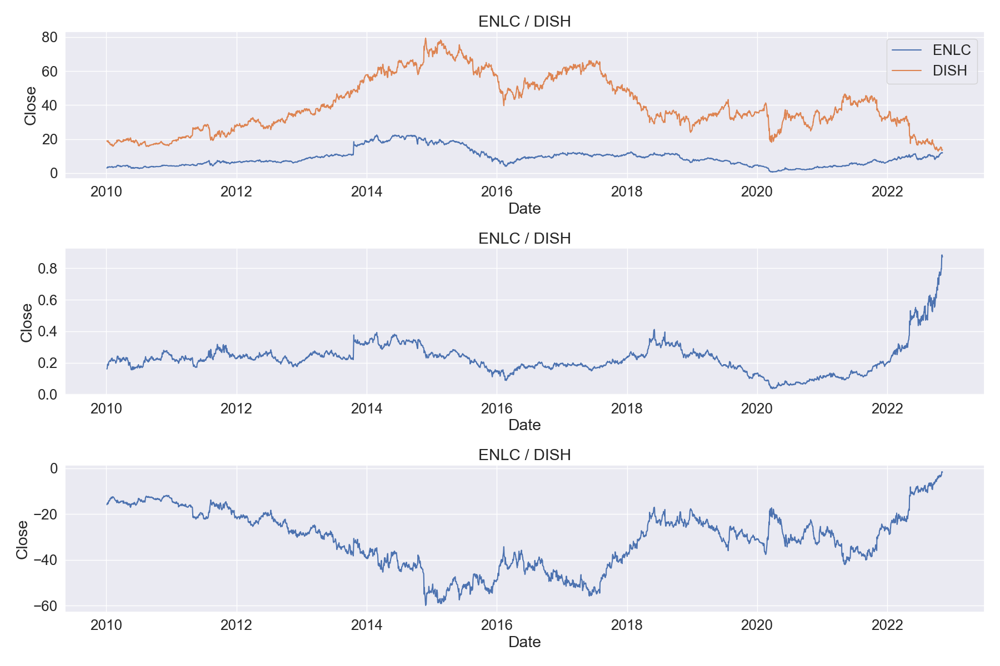

In [29]:
pair("ENLC", "DISH", "LONG position ENLC P/E ratio=22.3, dividend: 0.038, Gross Profit: 1655100",
     "SHORT position DISH P/E ratio = 4.55, dividend: None, Gross profit: 6142823");

Long BETA: 1.14
Short BETA: 1.58
LONG position ENLC P/E ratio=22.3, dividend: 0.038, Gross Profit: 1655100
SHORT position M P/E ratio = 3.83, dividend: 0.032, Gross profit: 10336000


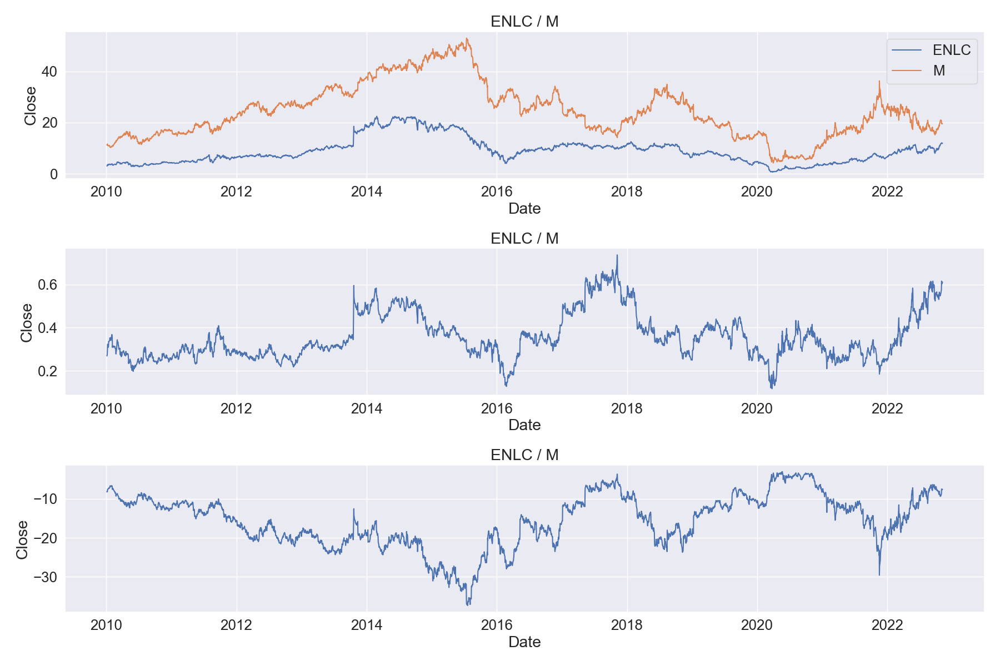

In [30]:
pair("ENLC", "M", "LONG position ENLC P/E ratio=22.3, dividend: 0.038, Gross Profit: 1655100",
     "SHORT position M P/E ratio = 3.83, dividend: 0.032, Gross profit: 10336000");

Long BETA: 1.14
Short BETA: 1.29
LONG position ENLC P/E ratio=22.3, dividend: 0.038, Gross Profit: 1655100
SHORT position RLJ P/E ratio=None, dividend: 0.017, Gross profit: 185340


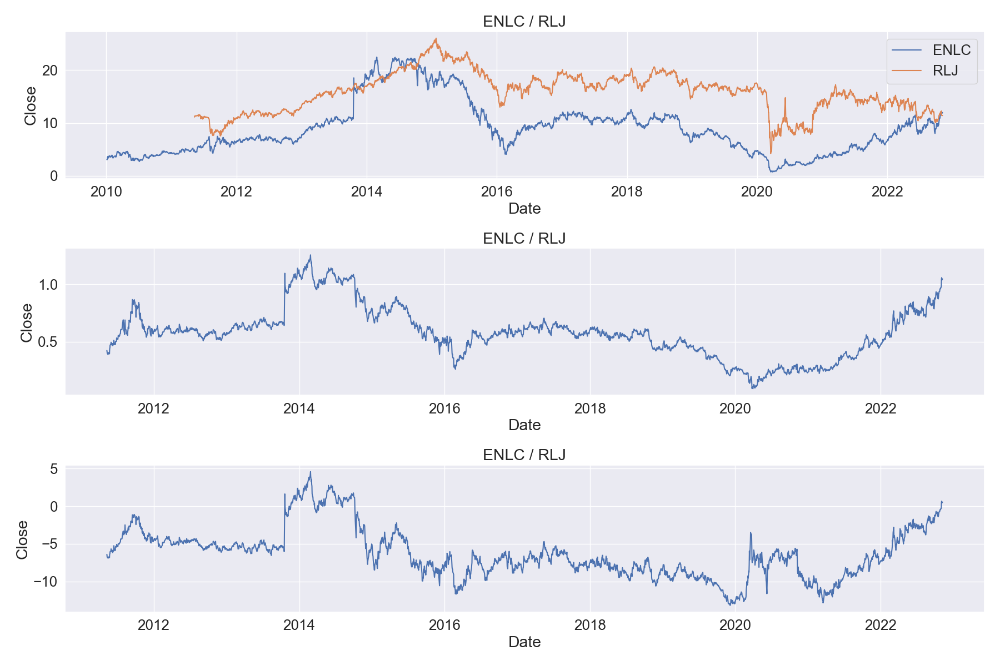

In [32]:
pair("ENLC", "RLJ", "LONG position ENLC P/E ratio=22.3, dividend: 0.038, Gross Profit: 1655100",
     "SHORT position RLJ P/E ratio=None, dividend: 0.017, Gross profit: 185340");

Long BETA: 1.14
Short BETA: 1.06
LONG position ENLC P/E ratio=22.3, dividend: 0.038, Gross Profit: 1655100
SHORT position SITC P/E ratio = 13.93, dividend: 0.04, Gross profit: 429494


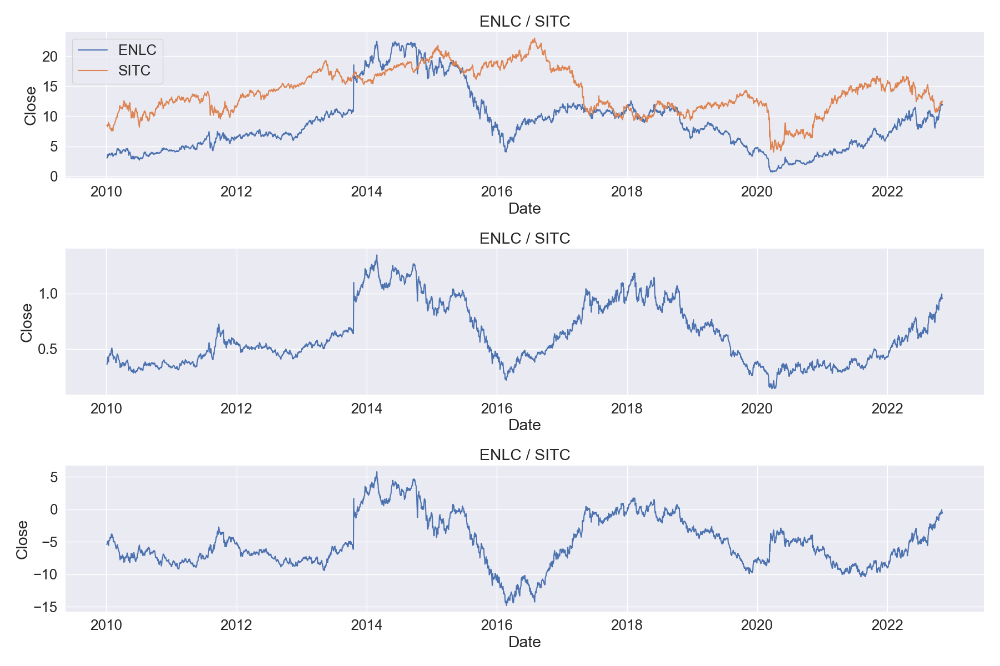

In [33]:
pair("ENLC", "SITC", "LONG position ENLC P/E ratio=22.3, dividend: 0.038, Gross Profit: 1655100",
     "SHORT position SITC P/E ratio = 13.93, dividend: 0.04, Gross profit: 429494");

Long BETA: 0.81
Short BETA: 1.22
LONG position ET P/E ratio=9.17, dividend: 0.086, Gross Profit: 13585000
SHORT position ADEA P/E ratio = None, dividend: 0.017, Gross profit: 750938


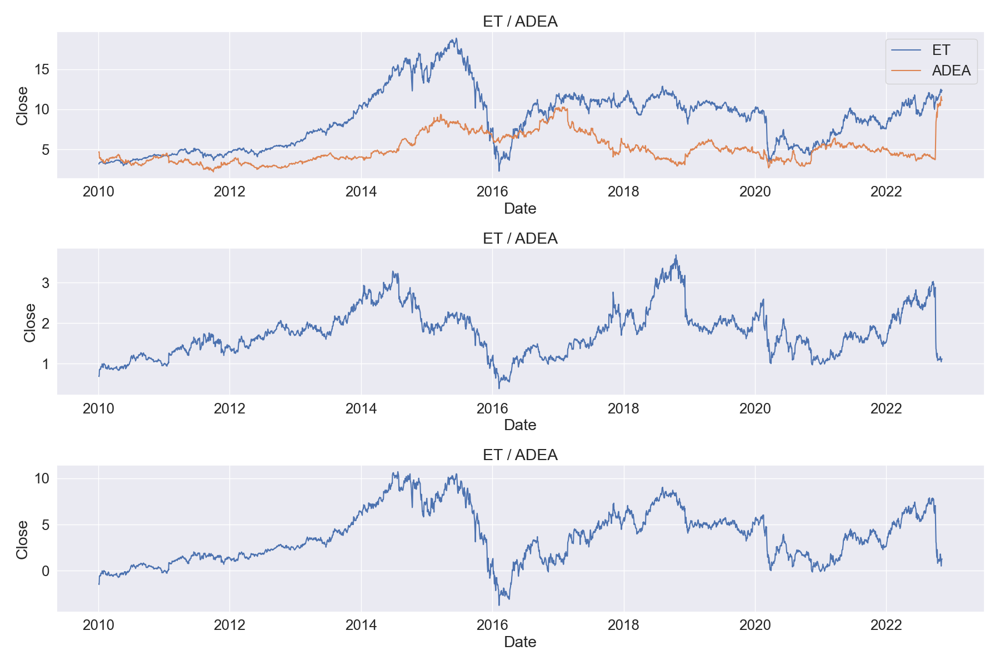

In [34]:
pair("ET", "ADEA", "LONG position ET P/E ratio=9.17, dividend: 0.086, Gross Profit: 13585000",
     "SHORT position ADEA P/E ratio = None, dividend: 0.017, Gross profit: 750938");

Long BETA: 0.81
Short BETA: 1.4
LONG position ET P/E ratio=9.17, dividend: 0.086, Gross Profit: 13585000
SHORT position DRH P/E ratio = 37.43, dividend: 0.014, Gross profit: 105428


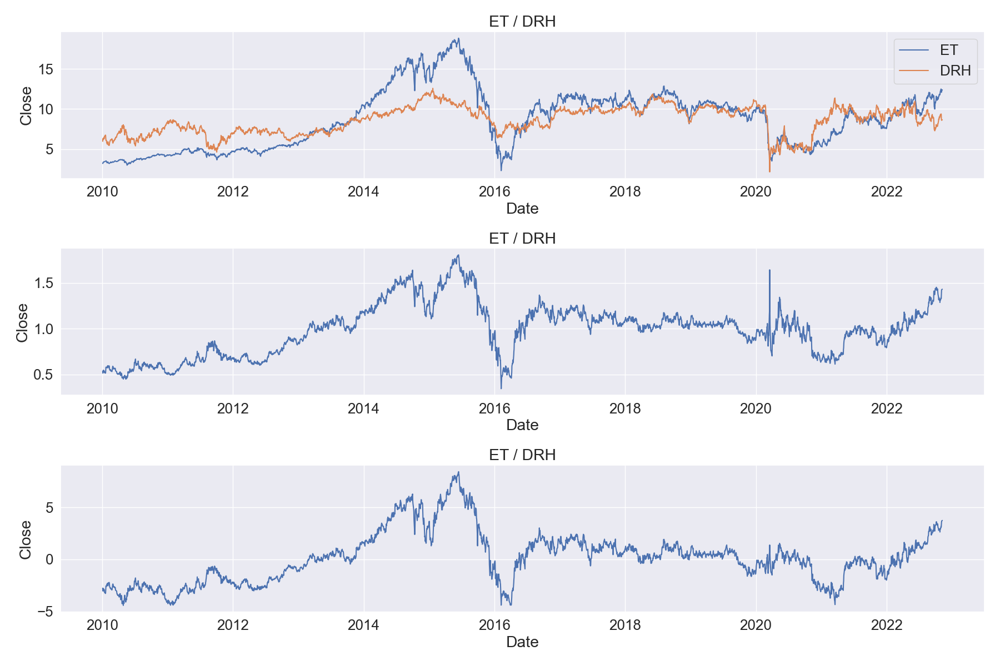

In [36]:
pair("ET", "DRH", "LONG position ET P/E ratio=9.17, dividend: 0.086, Gross Profit: 13585000",
     "SHORT position DRH P/E ratio = 37.43, dividend: 0.014, Gross profit: 105428");

Long BETA: 0.81
Short BETA: 1.58
LONG position ET P/E ratio=9.17, dividend: 0.086, Gross Profit: 13585000
SHORT position M P/E ratio=3.83, dividend: 0.032, Gross profit: 10336000


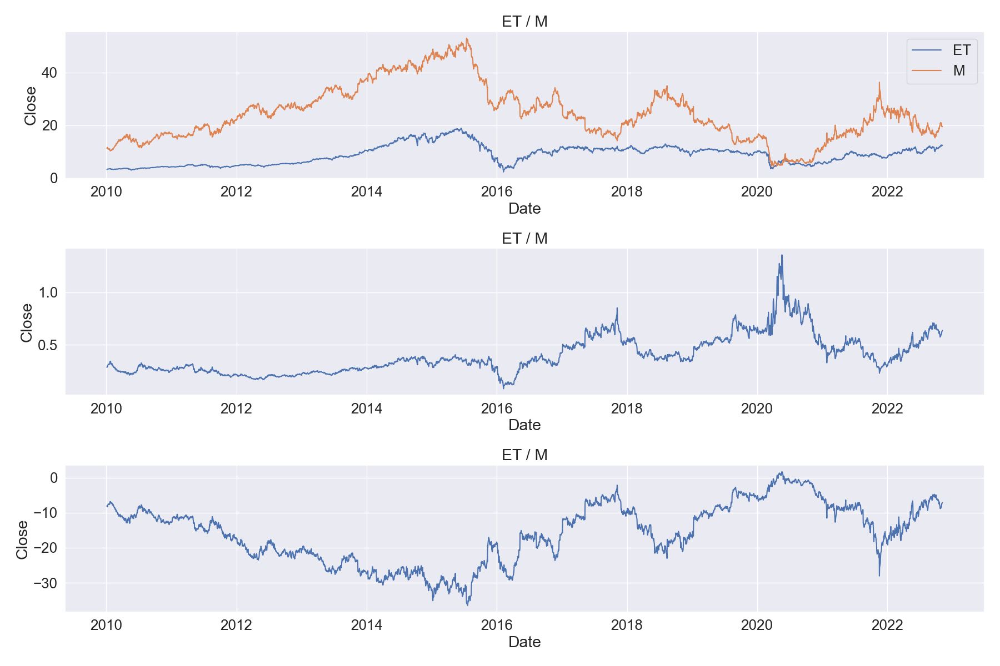

In [37]:
pair("ET", "M", "LONG position ET P/E ratio=9.17, dividend: 0.086, Gross Profit: 13585000",
     "SHORT position M P/E ratio=3.83, dividend: 0.032, Gross profit: 10336000");

Long BETA: 0.81
Short BETA: 1.29
LONG position ET P/E ratio=9.17, dividend: 0.086, Gross Profit: 13585000
SHORT position RLJ P/E ratio = None, dividend: 0.017, Gross profit: 185340


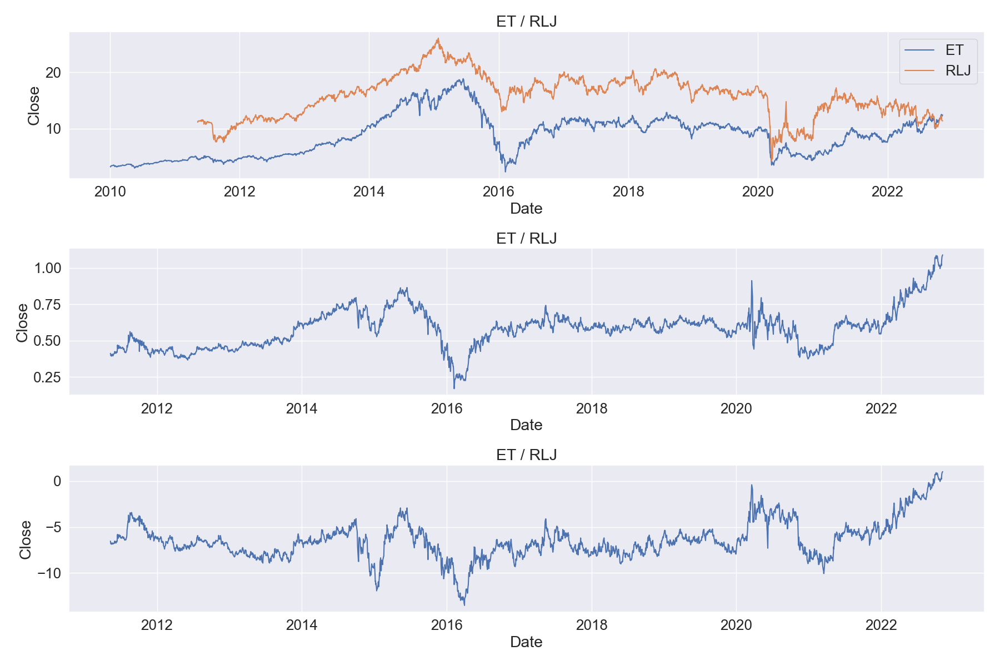

In [38]:
pair("ET", "RLJ", "LONG position ET P/E ratio=9.17, dividend: 0.086, Gross Profit: 13585000",
     "SHORT position RLJ P/E ratio = None, dividend: 0.017, Gross profit: 185340");

Long BETA: 0.81
Short BETA: 1.32
LONG position ET P/E ratio=9.17, dividend: 0.086, Gross Profit: 13585000
SHORT position IOVA P/E ratio = None, dividend: None, Gross profit: 0


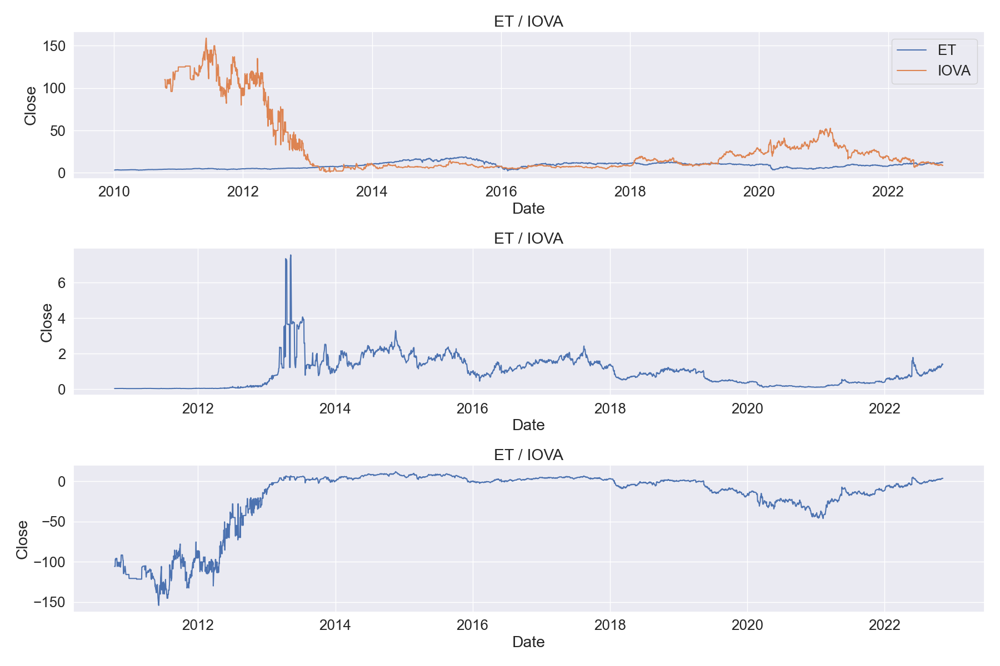

In [40]:
pair("ET", "IOVA", "LONG position ET P/E ratio=9.17, dividend: 0.086, Gross Profit: 13585000",
     "SHORT position IOVA P/E ratio = None, dividend: None, Gross profit: 0");

Long BETA: 1.12
Short BETA: 1.45
LONG position FBP P/E ratio=9.89, dividend: 0.031, Gross Profit: 916117
SHORT position CDMO P/E ratio=8.67, dividend: None, Gross profit: 36648


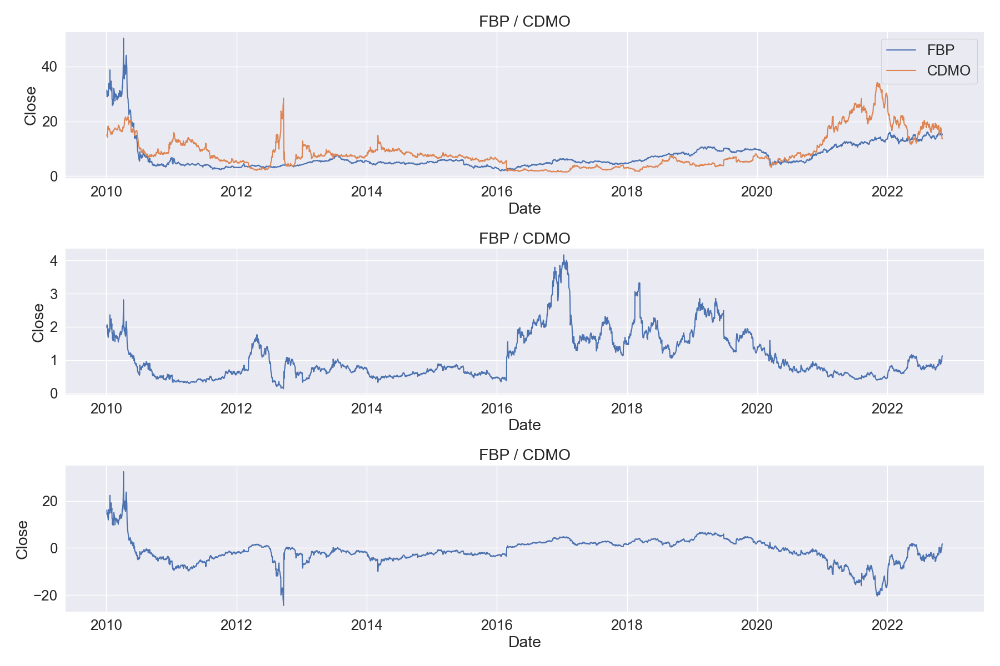

In [41]:
pair("FBP", "CDMO", "LONG position FBP P/E ratio=9.89, dividend: 0.031, Gross Profit: 916117",
     "SHORT position CDMO P/E ratio=8.67, dividend: None, Gross profit: 36648");

Long BETA: 1.12
Short BETA: 1.12
LONG position FBP P/E ratio=9.89, dividend: 0.031, Gross Profit: 916117
SHORT position RCM P/E ratio = 44.97, dividend: None, Gross profit: 311800


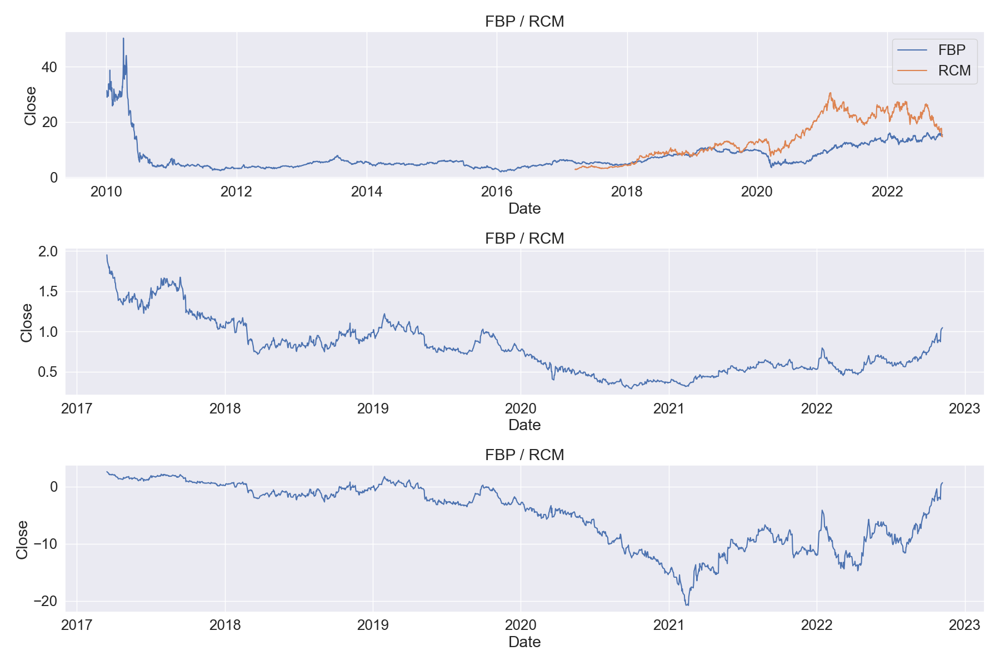

In [42]:
pair("FBP", "RCM", "LONG position FBP P/E ratio=9.89, dividend: 0.031, Gross Profit: 916117",
     "SHORT position RCM P/E ratio = 44.97, dividend: None, Gross profit: 311800");

Long BETA: 1.07
Short BETA: 1.33
LONG position HBAN P/E ratio=11.83, dividend: 0.04, Gross Profit: 5958000
SHORT position KOS P/E ratio=15.86, dividend: None, Gross profit: 987855


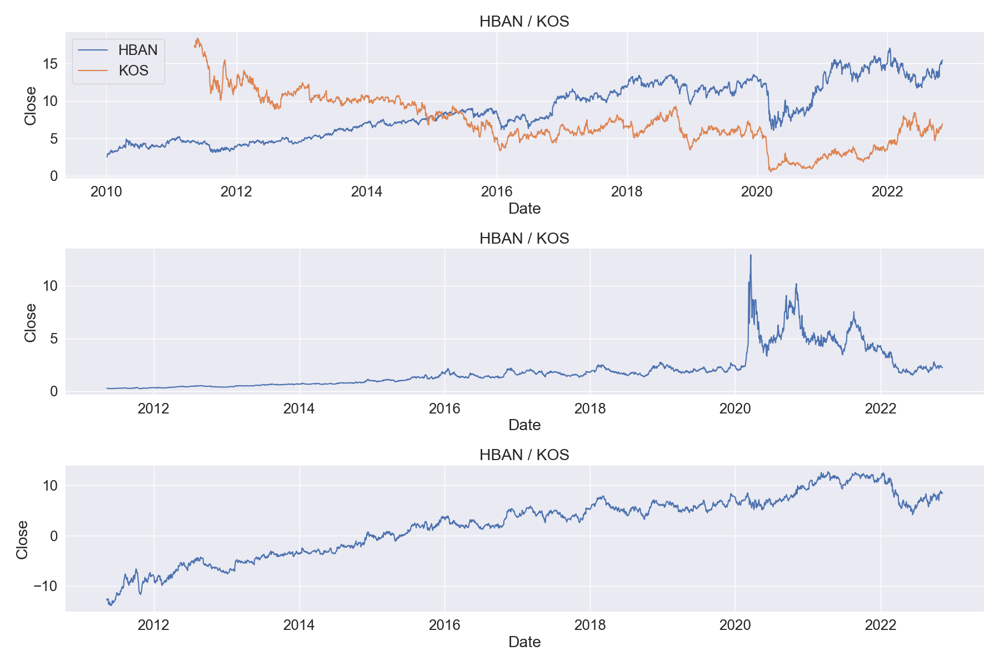

In [56]:
pair("HBAN", "KOS", "LONG position HBAN P/E ratio=11.83, dividend: 0.04, Gross Profit: 5958000",
     "SHORT position KOS P/E ratio=15.86, dividend: None, Gross profit: 987855");

Long BETA: 0.56
Short BETA: 1.26
LONG position NWBI P/E ratio=14.68, dividend: 0.05, Gross Profit: 546034
SHORT position INN P/E ratio = None, dividend: 0.02, Gross profit: 158663


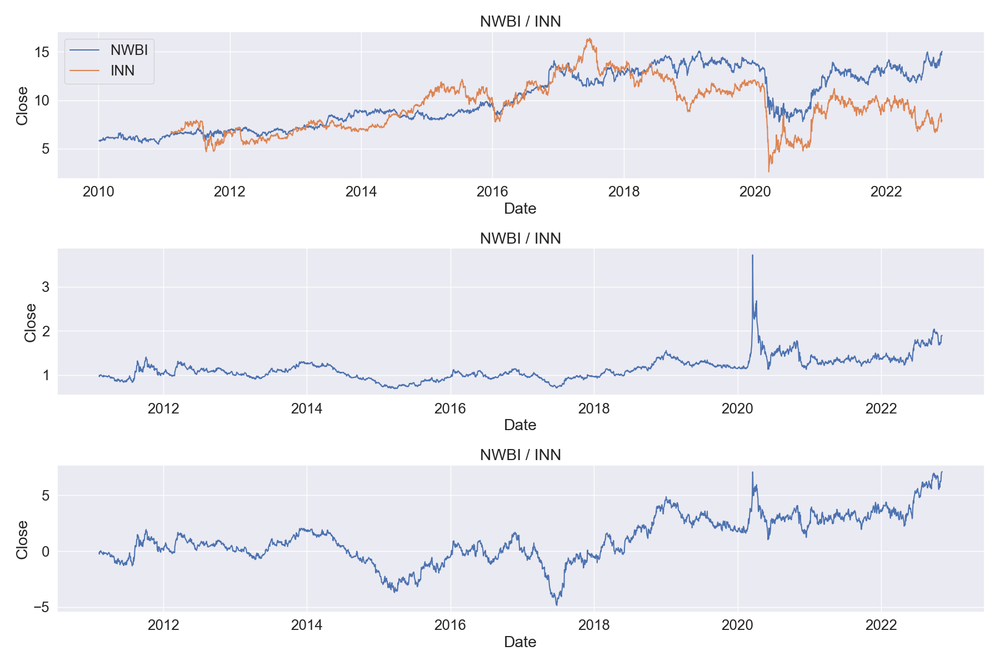

In [57]:
pair("NWBI", "INN", "LONG position NWBI P/E ratio=14.68, dividend: 0.05, Gross Profit: 546034",
     "SHORT position INN P/E ratio = None, dividend: 0.02, Gross profit: 158663");

Long BETA: 1.04
Short BETA: 1.4
LONG position SCS P/E ratio=59.76, dividend: 0.05, Gross Profit: 761500
SHORT position DRH P/E ratio=37.43, dividend: 0.014, Gross profit: 105428


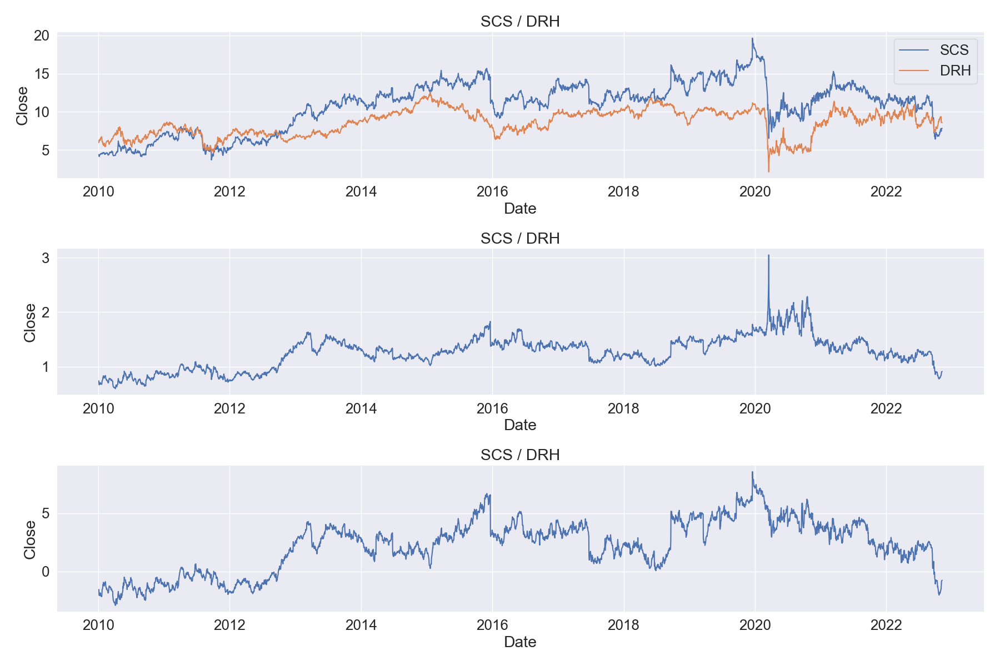

In [59]:
pair("SCS", "DRH", "LONG position SCS P/E ratio=59.76, dividend: 0.05, Gross Profit: 761500",
     "SHORT position DRH P/E ratio=37.43, dividend: 0.014, Gross profit: 105428");

Long BETA: 1.01
Short BETA: 1.51
LONG position VLY P/E ratio=11.53, dividend: 0.03, Gross Profit: 1321371
SHORT position EVRI P/E ratio=11.15, dividend: None, Gross profit: 544936


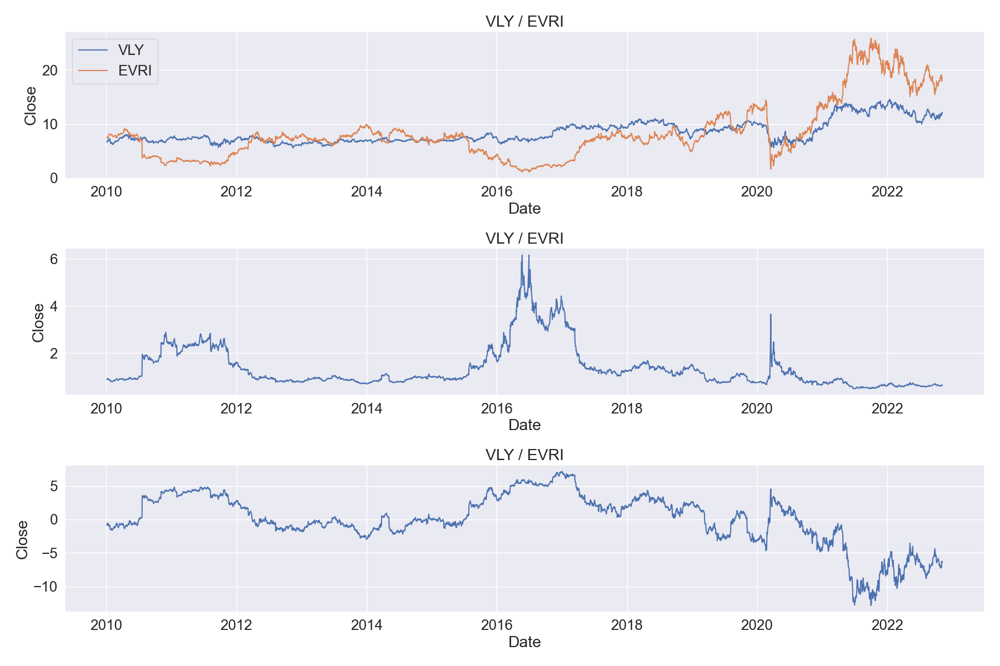

In [61]:
pair("VLY", "EVRI", "LONG position VLY P/E ratio=11.53, dividend: 0.03, Gross Profit: 1321371",
     "SHORT position EVRI P/E ratio=11.15, dividend: None, Gross profit: 544936");

Long BETA: 1.01
Short BETA: 1.63
LONG position VLY P/E ratio=11.53, dividend: 0.03, Gross Profit: 1321371
SHORT position FORM P/E ratio=15.87, dividend: None, Gross profit: 326695


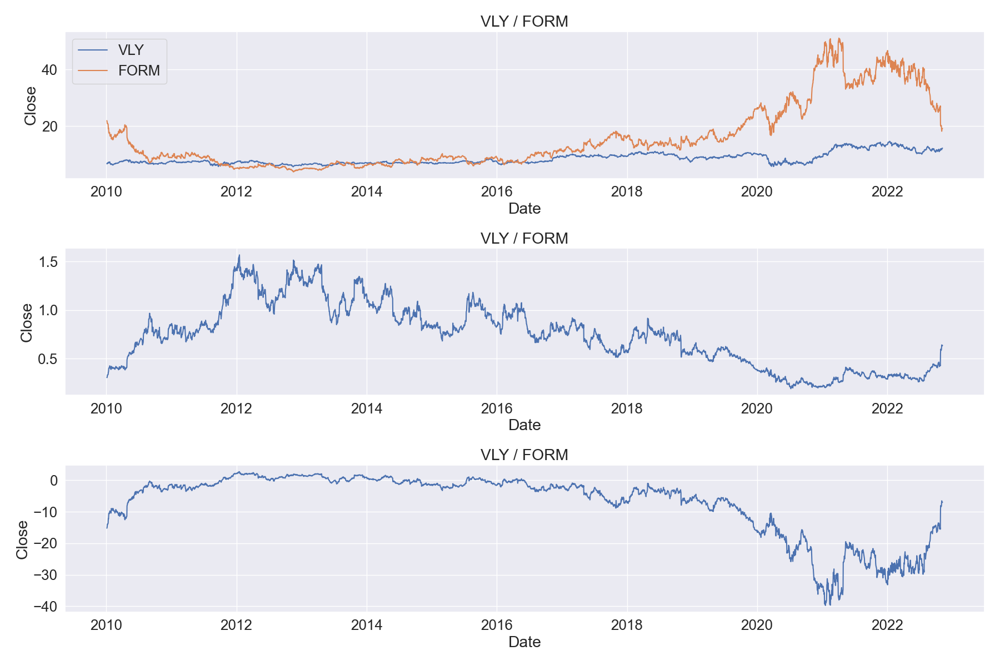

In [62]:
pair("VLY", "FORM", "LONG position VLY P/E ratio=11.53, dividend: 0.03, Gross Profit: 1321371",
     "SHORT position FORM P/E ratio=15.87, dividend: None, Gross profit: 326695");

Long BETA: 1.01
Short BETA: 1.12
LONG position VLY P/E ratio=11.53, dividend: 0.03, Gross Profit: 1321371
SHORT position RCM P/E ratio = 44.45, dividend: None, Gross profit: 311800


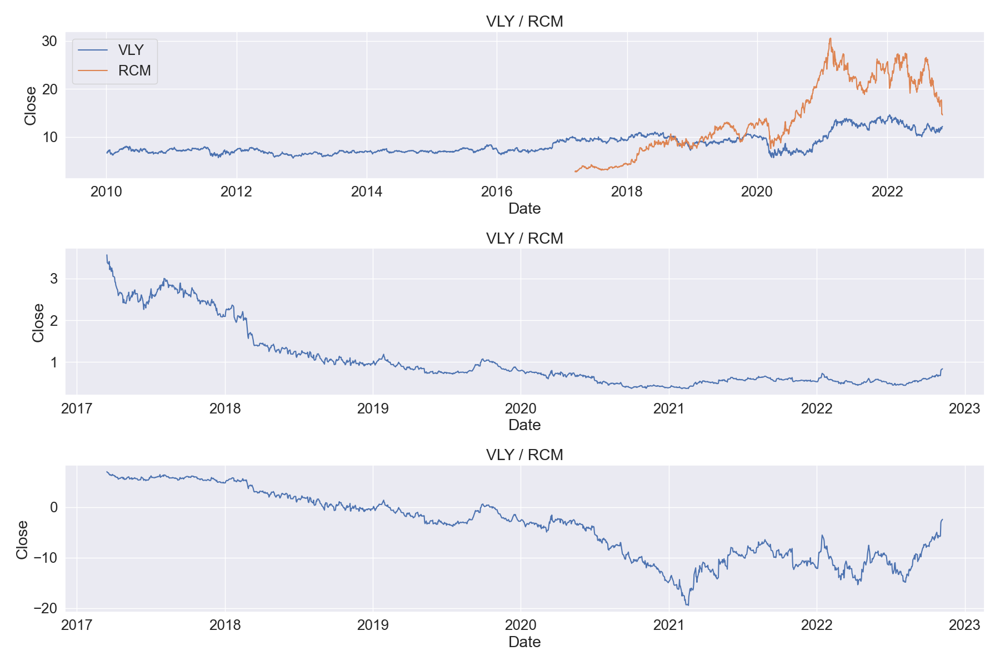

In [63]:
pair("VLY", "RCM", "LONG position VLY P/E ratio=11.53, dividend: 0.03, Gross Profit: 1321371",
     "SHORT position RCM P/E ratio = 44.45, dividend: None, Gross profit: 311800");